# Generate data for class label and properties mturk task

In [14]:
import base64
import io
import os
import numpy as np
from PIL import Image
import cv2
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import requests
import urllib.request
from IPython.core.display import display, HTML
from ast import literal_eval

pd.set_option('max_colwidth', 300)
matplotlib.rcParams['figure.figsize'] = (20, 7.0)

display(HTML(
    """
    <style>
    .container { width:100% !important; }
    #notebook { letter-spacing: normal !important;; }
    .CodeMirror { font-family: monospace !important; }
    .cm-keyword { font-weight: bold !important; color: #008000 !important; }
    .cm-comment { font-style: italic !important; color: #408080 !important; }
    .cm-operator { font-weight: bold !important; color: #AA22FF !important; }
    .cm-number { color: #080 !important; }
    .cm-builtin { color: #008000 !important; }
    .cm-string { color: #BA2121 !important; }
    </style>
    """
))

In [15]:
def convertToHttp(url):
    return 'http' + url[5:]
    
def decodeAndImg(image_dat):
    image = base64.b64decode(str(image_dat))       
    img = Image.open(io.BytesIO(image))
    return img.convert('RGB')

def decodeAndImgRaw(image_dat):
    image = base64.b64decode(str(image_dat))       
    img = Image.open(io.BytesIO(image))
    return img

def url_to_image(url):
    """Converts an image url to a PIL image.
    """
    resp = urllib.request.urlopen(url)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return Image.fromarray(image)

def getImageNameFromURL(url):
    idxs = url.find("habitat_turk_data")
    idxe = url.find(".jpg")
    return url[idxs+len('habitat_turk_data')+1:idxe]

def hex_to_rgb(hex):
    hex = hex.lstrip('#')
    hlen = len(hex)
    return tuple(int(hex[i:i + hlen // 3], 16) for i in range(0, hlen, hlen // 3))

def read_csv_as_df(csv):
    df = pd.read_csv(csv)
    df['Answer.annotatedResult.instances'] = df['Answer.annotatedResult.instances'].apply(literal_eval)
    display(df.head(2))
    return df

def extract_masks(pngImgData, instances, categories):
    img = decodeAndImgRaw(pngImgData)
    valid_palette_colors = []
    
    for d in instances:
        if d['label'] in categories:
            valid_palette_colors.append(hex_to_rgb(d['color']))

    print('Valid Palette Colors {}'.format(valid_palette_colors))

#     print('img mode {}'.format(img.mode))
    img_c = img.copy()
    img_c = img_c.convert('RGB')
    print(img.size)

    val_mask = False
    for x in range(img.size[0]):
        for y in range(img.size[1]):
            val = img_c.getpixel((x,y))
            if val not in valid_palette_colors:
                img.putpixel((x,y), 0)
            else:
                val_mask = True
    return img, val_mask

def saveMasksAndImages(csv, mask_path, image_path, categories):
    df = read_csv_as_df(csv)
    df = df.groupby('Input.image_url').first().copy()
    
    for url, row in df.iterrows():
        if not os.path.exists(mask_path):
            os.mkdir(mask_path)
        
        print("Time take in minutes ", row['WorkTimeInSeconds']/60)
        print("WorkerID {}".format(str(row['WorkerId'])))
        
        mask, valid = extract_masks(row['Answer.annotatedResult.labeledImage.pngImageData'], row['Answer.annotatedResult.instances'], categories)
        
        if valid:
            name = getImageNameFromURL(url)         

            print(name)
            mask.save(mask_path + '/' + name + '.png')
            # Download the actual image 
            orig = url_to_image(url)
            orig.save(image_path + '/' + name + '.jpg')

            print("type(orig) {}, orig.size {} orig.mode {}".format(type(orig), orig.size, orig.mode))
            fig, ax = plt.subplots(1,2)

            plt.figure(figsize=(20,20))
            ax[0].imshow(mask)
            ax[1].imshow(orig)
            plt.show()   
        
        else:
            print("mask not eligible")

            plt.imshow(mask)
            plt.show()   

def extract_masks_of(pngImgData, colors):
    img = decodeAndImg(pngImgData)
    img_c = img.copy()
    val_mask = False
    for x in range(img.size[0]):
        for y in range(img.size[1]):
            val = img_c.getpixel((x,y))
            if val not in colors:
                img.putpixel((x,y), 0)
            else:
                val_mask = True
    return img, val_mask

In [16]:
area_min_threshold = 50*50
area_max_threshold = 200*200

def doesQualify(x1, y1, x2, y2):
    area = abs(x1-x2)* abs(y1-y2) 
    return area > area_min_threshold and area < area_max_threshold

def getbboxcoords(pngImgData, colors):
    img = decodeAndImg(pngImgData)
    print('img mode {}'.format(img.mode))
    img_c = img.copy()
    print(img.size)

    val_mask = False
    for x in range(img.size[0]):
        for y in range(img.size[1]):
            val = img_c.getpixel((x,y))
            if val not in colors:
                img.putpixel((x,y), 0)
            else:
                val_mask = True

    pos = np.where(img)
    xmin = np.min(pos[1])
    xmax = np.max(pos[1])
    ymin = np.min(pos[0])
    ymax = np.max(pos[0])

    # check for qualification in some way (area might be a good starting point)
    val_mask = doesQualify(xmin, ymin, xmax, ymax)
    
    return xmin, ymin, xmax, ymax, val_mask

def displayResultsbbox(filename, saveToDisk=False, path='.'):
# Load CSV of results 
    df = pd.read_csv(filename)
    df = df.groupby('Input.image_url').first().copy()

    print(df.shape)

    for url, row in df.iterrows():
        print("url {}".format(url))
        print("Time take in minutes ", row['WorkTimeInSeconds']/60)
        print("WorkerID {}".format(str(row['WorkerId'])))
        # do this per instance 
        print("Instances {}".format(row['Answer.annotatedResult.instances']))
        img = decodeAndImg(row['Answer.annotatedResult.labeledImage.pngImageData'])
        
        instances = literal_eval(row['Answer.annotatedResult.instances'])
#         print(type(instances))
        
        # Download the actual image 
        orig = url_to_image(url)
        orig_cv = cv2.cvtColor(np.array(orig), cv2.COLOR_RGB2BGR)

        for d in instances:
            # extract one mask at a time, then blend and save it.
            # d['label'], d['color']
            # get bbox coordinates for each mask
            x, y, w, h = 100, 100, 200, 200
            color = (0, 255, 255)
            thickness = 2
            xmin, ymin, xmax, ymax, val = getbboxcoords(row['Answer.annotatedResult.labeledImage.pngImageData'], [hex_to_rgb(d['color'])]) 
            if val:
                orig_cvc = orig_cv.copy() 
                cv2.rectangle(orig_cvc, (xmin,ymin), (xmax, ymax), color, thickness)
                
                if saveToDisk:
                    if not os.path.exists(path):
                        os.mkdir(path)
                    name = getImageNameFromURL(url)         
#                     print("name ", name)
                    cv2.imwrite(path + '/' + name + d['color'] + '.png', orig_cvc)
                
                plt.figure(figsize=(10,10))
                plt.imshow(cv2.cvtColor(orig_cvc, cv2.COLOR_BGR2RGB))
                plt.show()

(9, 33)
url https://locobot-bucket.s3-us-west-2.amazonaws.com/ActiveVisionDatasets/habitat_turk_data/00000.jpg
Time take in minutes  8.816666666666666
WorkerID ALWYZOTS2TNRL
Instances [{"color":"#2ca02c","label":"Object"},{"color":"#1f77b4","label":"Object"},{"color":"#ff7f0e","label":"Object"},{"color":"#d62728","label":"Object"},{"color":"#9467bd","label":"Object"},{"color":"#8c564b","label":"Object"},{"color":"#e377c2","label":"Object"},{"color":"#7f7f7f","label":"Object"},{"color":"#bcbd22","label":"Object"},{"color":"#ff9896","label":"Object"},{"color":"#17becf","label":"Object"},{"color":"#aec7e8","label":"Object"},{"color":"#ffbb78","label":"Object"}]
img mode RGB
(512, 512)


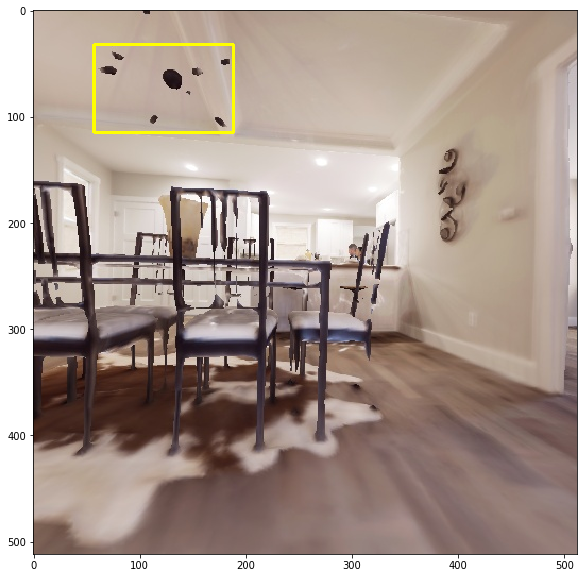

img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)


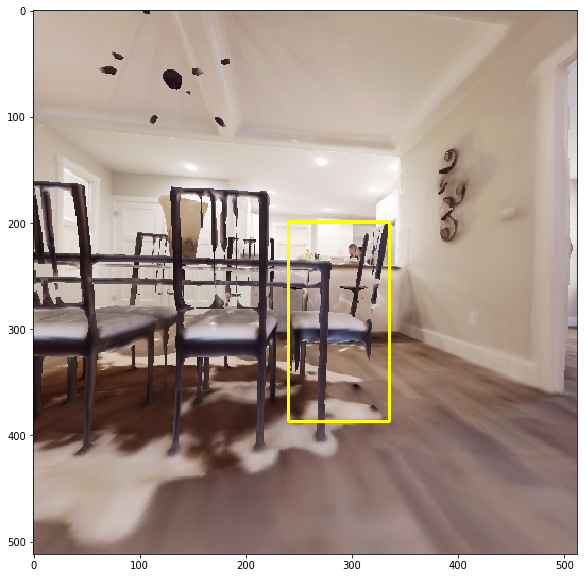

img mode RGB
(512, 512)


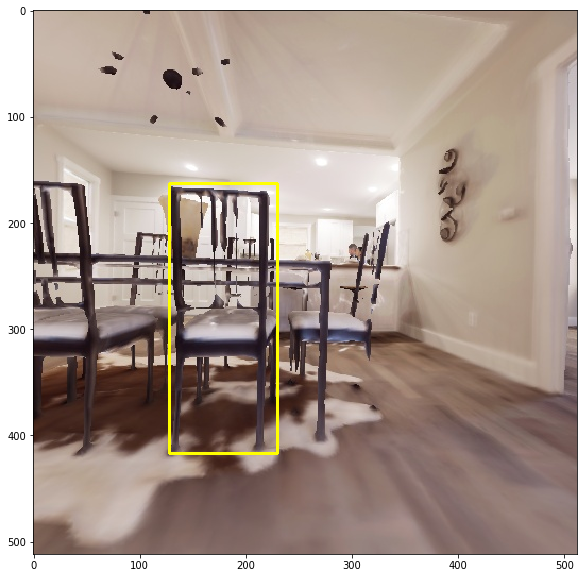

img mode RGB
(512, 512)


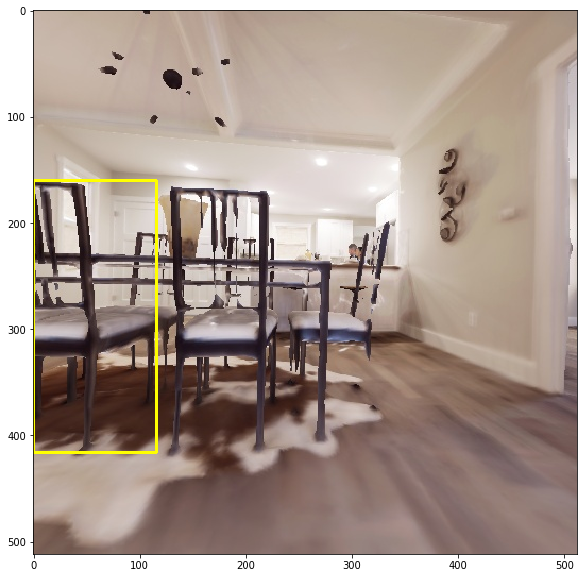

img mode RGB
(512, 512)


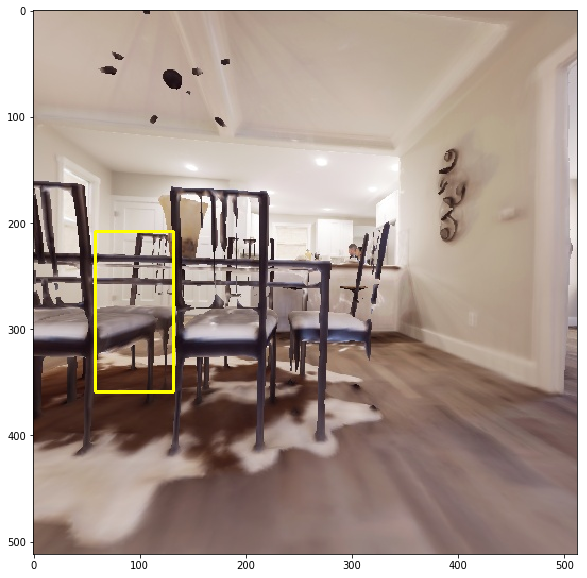

img mode RGB
(512, 512)
img mode RGB
(512, 512)


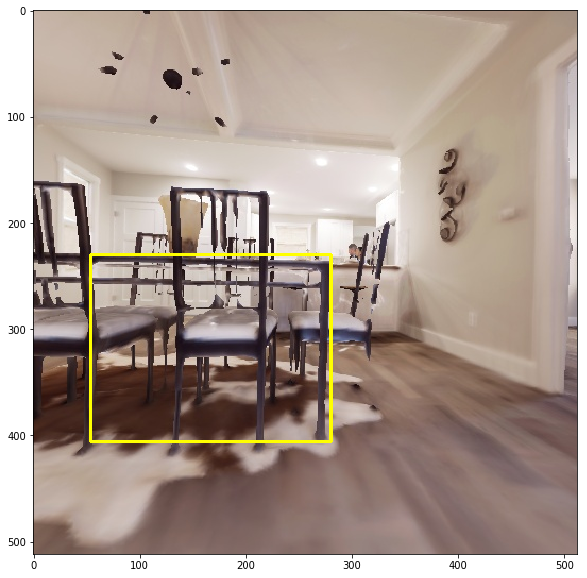

img mode RGB
(512, 512)


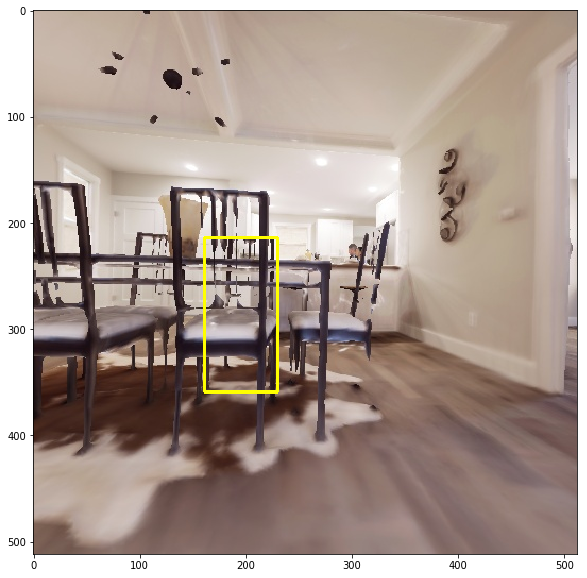

url https://locobot-bucket.s3-us-west-2.amazonaws.com/ActiveVisionDatasets/habitat_turk_data/00060.jpg
Time take in minutes  8.583333333333334
WorkerID A1HAX74U9X7MH7
Instances [{"color":"#2ca02c","label":"Object"},{"color":"#1f77b4","label":"Object"},{"color":"#ff7f0e","label":"Object"},{"color":"#d62728","label":"Object"},{"color":"#9467bd","label":"Object"},{"color":"#8c564b","label":"Object"},{"color":"#e377c2","label":"Object"},{"color":"#7f7f7f","label":"Object"},{"color":"#bcbd22","label":"Object"},{"color":"#ff9896","label":"Object"}]
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)


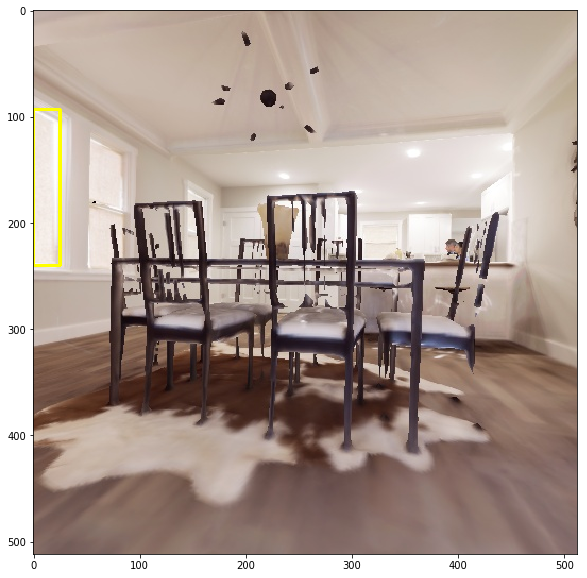

img mode RGB
(512, 512)


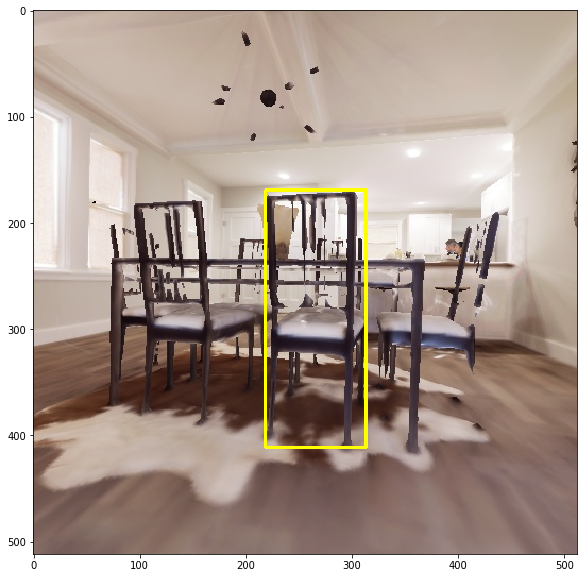

img mode RGB
(512, 512)
img mode RGB
(512, 512)
url https://locobot-bucket.s3-us-west-2.amazonaws.com/ActiveVisionDatasets/habitat_turk_data/00120.jpg
Time take in minutes  9.5
WorkerID ALWYZOTS2TNRL
Instances [{"color":"#2ca02c","label":"Object"},{"color":"#1f77b4","label":"Object"},{"color":"#ff7f0e","label":"Object"},{"color":"#d62728","label":"Object"},{"color":"#9467bd","label":"Object"},{"color":"#8c564b","label":"Object"},{"color":"#e377c2","label":"Object"},{"color":"#7f7f7f","label":"Object"},{"color":"#bcbd22","label":"Object"},{"color":"#ff9896","label":"Object"},{"color":"#17becf","label":"Object"},{"color":"#aec7e8","label":"Object"},{"color":"#ffbb78","label":"Object"}]
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)


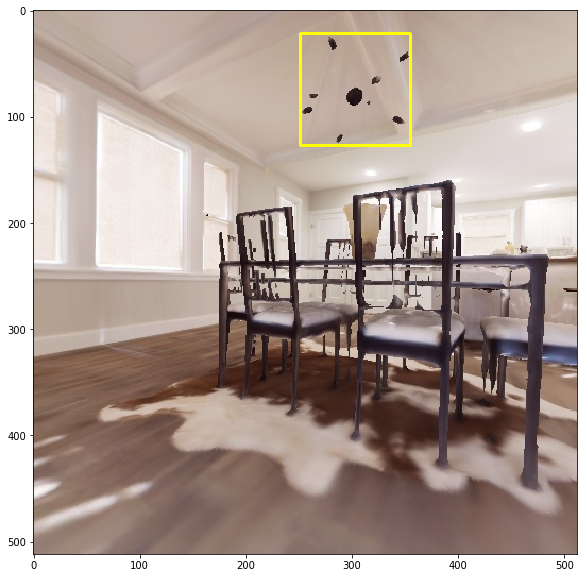

img mode RGB
(512, 512)


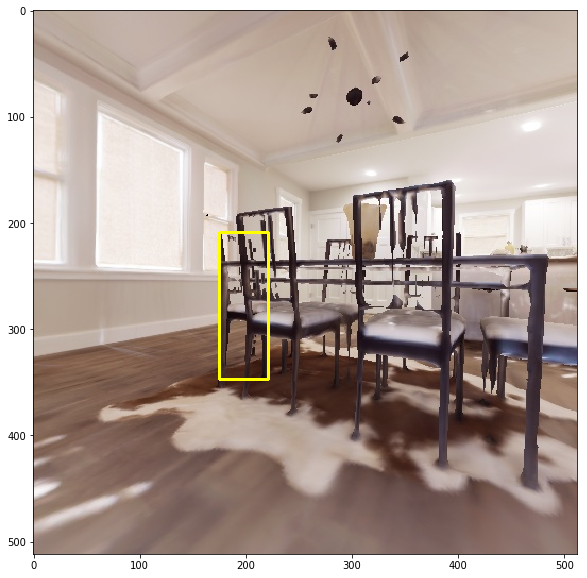

img mode RGB
(512, 512)
img mode RGB
(512, 512)


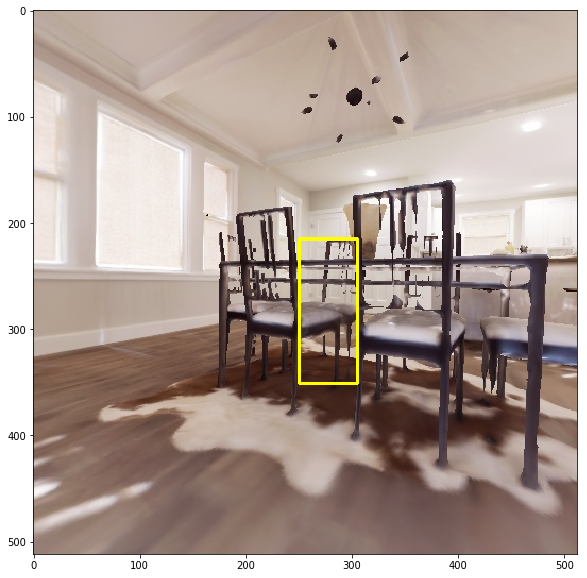

img mode RGB
(512, 512)


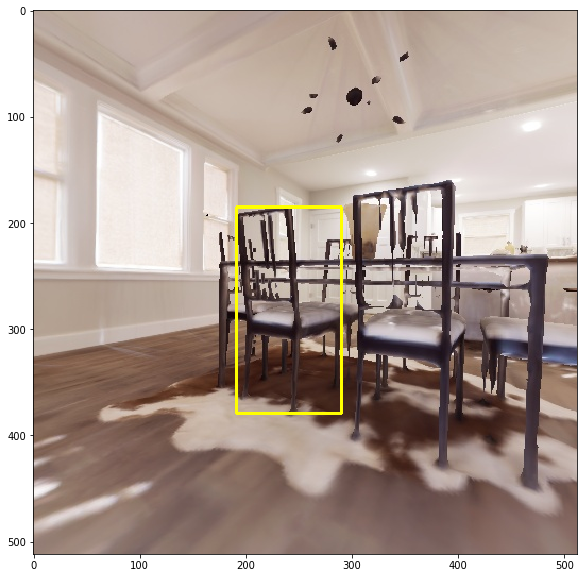

img mode RGB
(512, 512)


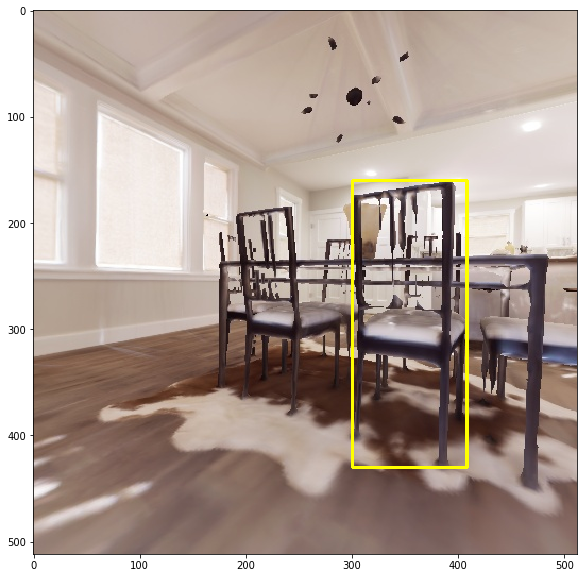

img mode RGB
(512, 512)
img mode RGB
(512, 512)


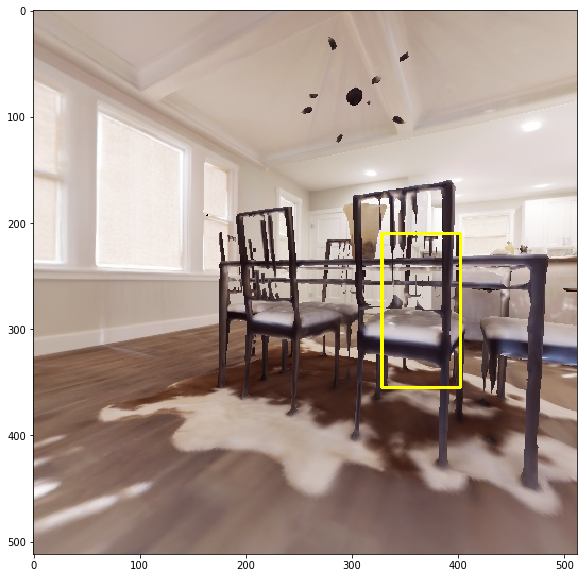

img mode RGB
(512, 512)


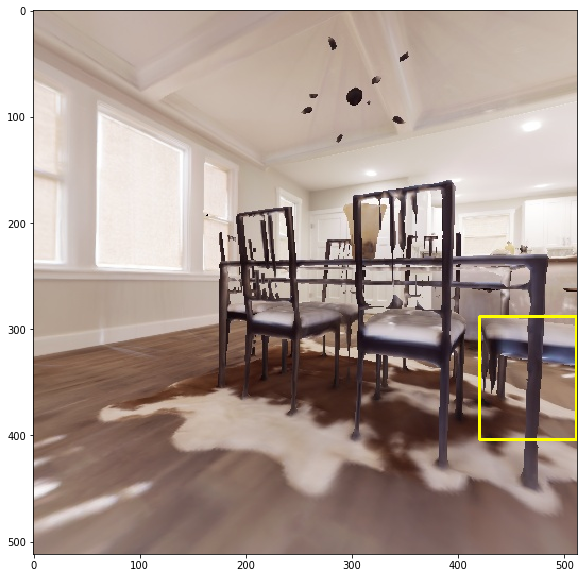

img mode RGB
(512, 512)
img mode RGB
(512, 512)
url https://locobot-bucket.s3-us-west-2.amazonaws.com/ActiveVisionDatasets/habitat_turk_data/00180.jpg
Time take in minutes  9.75
WorkerID A3UPK21PVHUJ09
Instances [{"color":"#2ca02c","label":"Object"},{"color":"#ff7f0e","label":"Object"},{"color":"#d62728","label":"Object"},{"color":"#9467bd","label":"Object"},{"color":"#e377c2","label":"Object"},{"color":"#7f7f7f","label":"Object"}]
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)


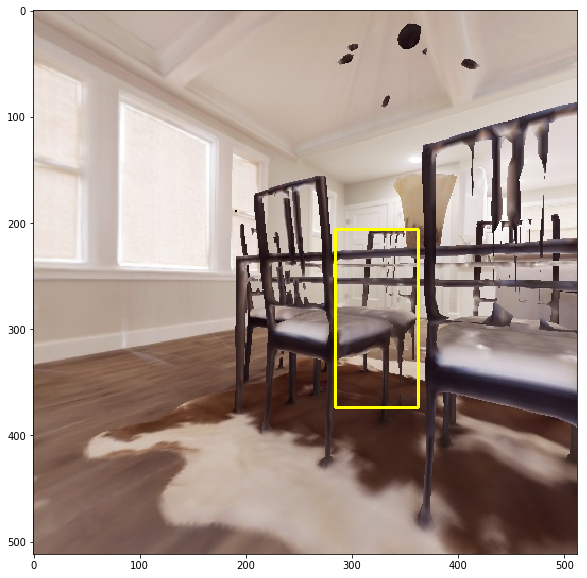

img mode RGB
(512, 512)
img mode RGB
(512, 512)


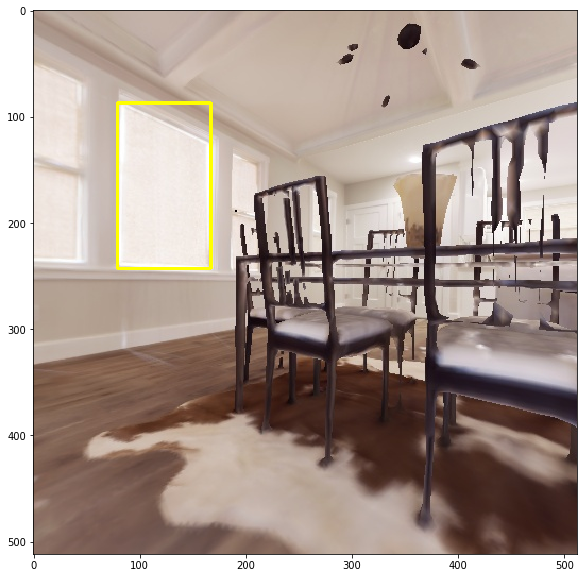

img mode RGB
(512, 512)


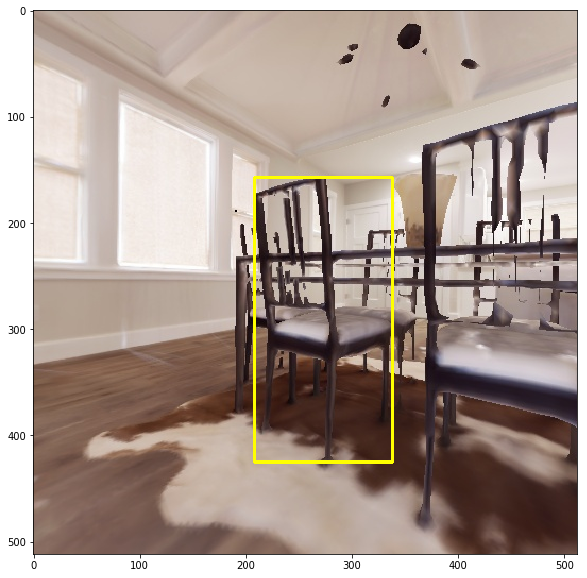

url https://locobot-bucket.s3-us-west-2.amazonaws.com/ActiveVisionDatasets/habitat_turk_data/00240.jpg
Time take in minutes  7.166666666666667
WorkerID AZS1ZZRYENXVK
Instances [{"color":"#2ca02c","label":"Object"},{"color":"#1f77b4","label":"Object"},{"color":"#ff7f0e","label":"Object"},{"color":"#d62728","label":"Object"},{"color":"#9467bd","label":"Object"}]
img mode RGB
(512, 512)
img mode RGB
(512, 512)


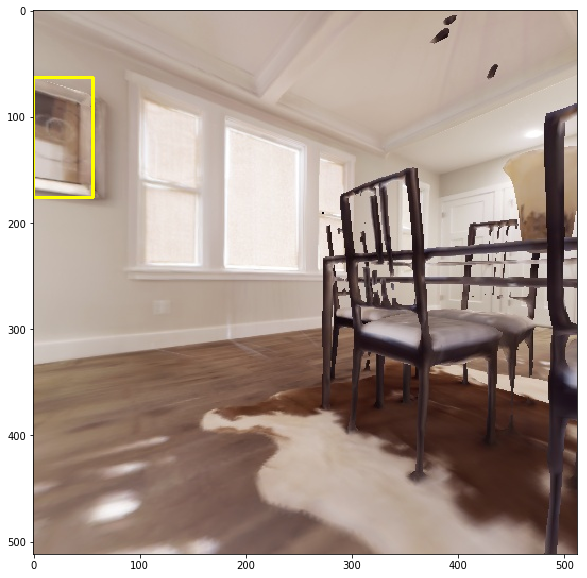

img mode RGB
(512, 512)


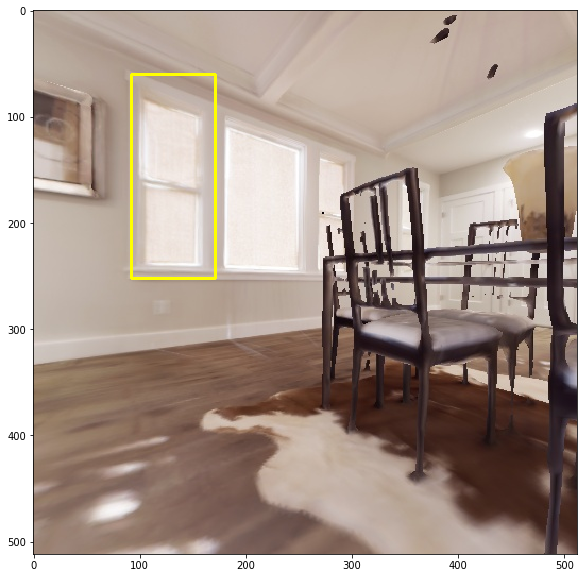

img mode RGB
(512, 512)


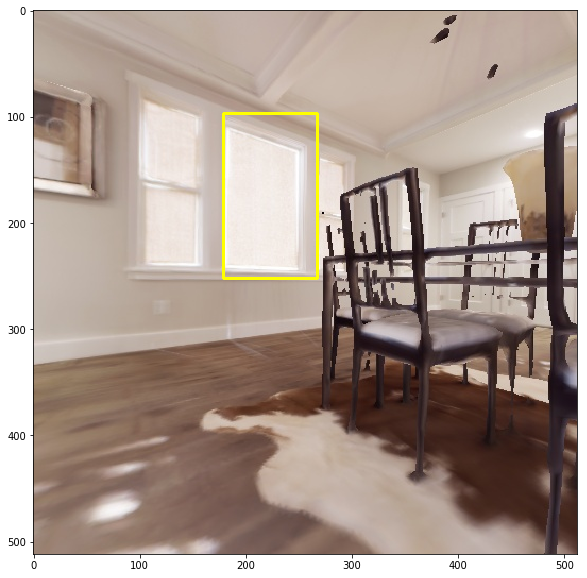

img mode RGB
(512, 512)


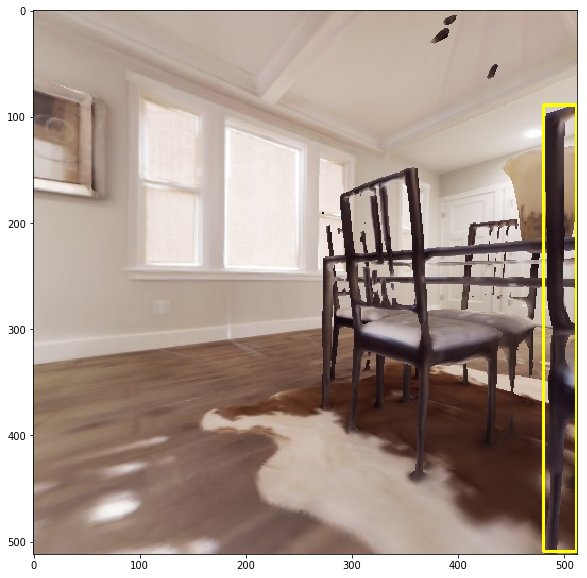

url https://locobot-bucket.s3-us-west-2.amazonaws.com/ActiveVisionDatasets/habitat_turk_data/00300.jpg
Time take in minutes  8.583333333333334
WorkerID A2HHIBGZ7HDJZS
Instances [{"color":"#2ca02c","label":"Object"},{"color":"#1f77b4","label":"Object"},{"color":"#ff7f0e","label":"Object"},{"color":"#d62728","label":"Object"},{"color":"#9467bd","label":"Object"},{"color":"#8c564b","label":"Object"},{"color":"#e377c2","label":"Object"},{"color":"#7f7f7f","label":"Object"},{"color":"#bcbd22","label":"Object"},{"color":"#ff9896","label":"Object"}]
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)


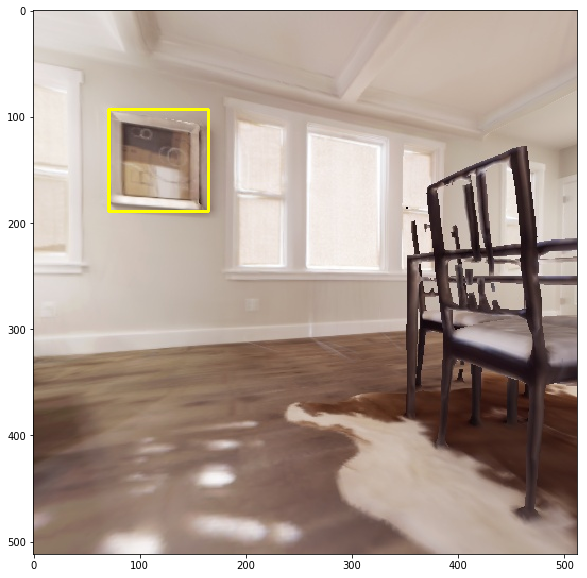

img mode RGB
(512, 512)


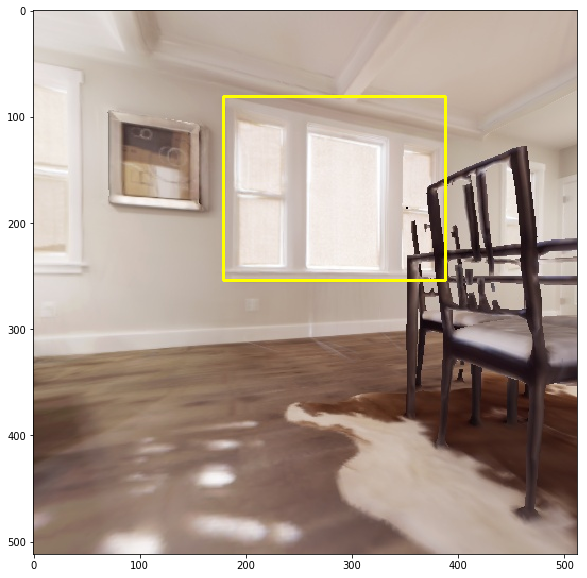

img mode RGB
(512, 512)
img mode RGB
(512, 512)


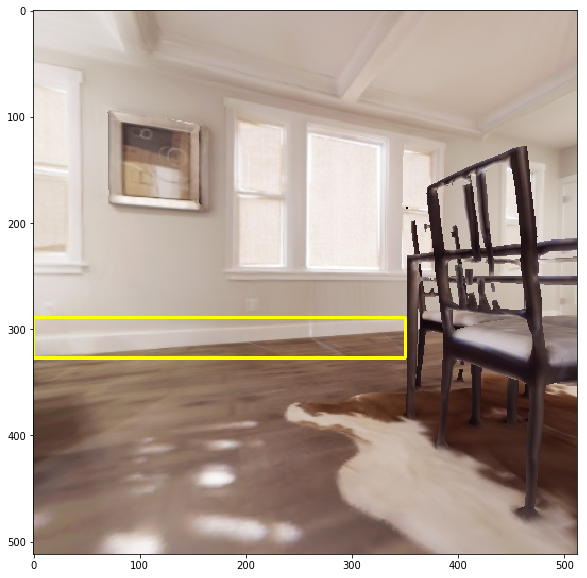

img mode RGB
(512, 512)


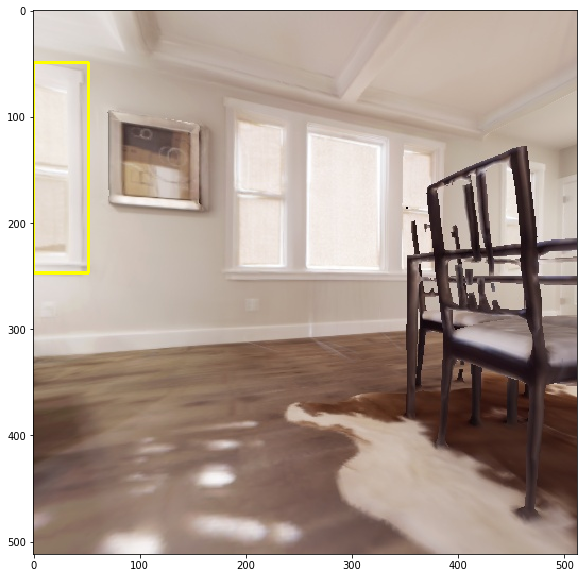

img mode RGB
(512, 512)
img mode RGB
(512, 512)


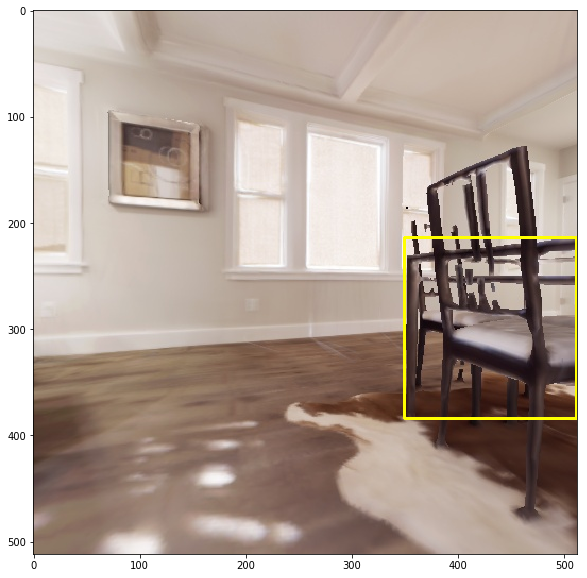

img mode RGB
(512, 512)
url https://locobot-bucket.s3-us-west-2.amazonaws.com/ActiveVisionDatasets/habitat_turk_data/00360.jpg
Time take in minutes  4.7
WorkerID A1M52J1BIO1O2V
Instances [{"color":"#2ca02c","label":"Object"},{"color":"#1f77b4","label":"Object"},{"color":"#ff7f0e","label":"Object"},{"color":"#d62728","label":"Object"},{"color":"#9467bd","label":"Object"}]
img mode RGB
(512, 512)


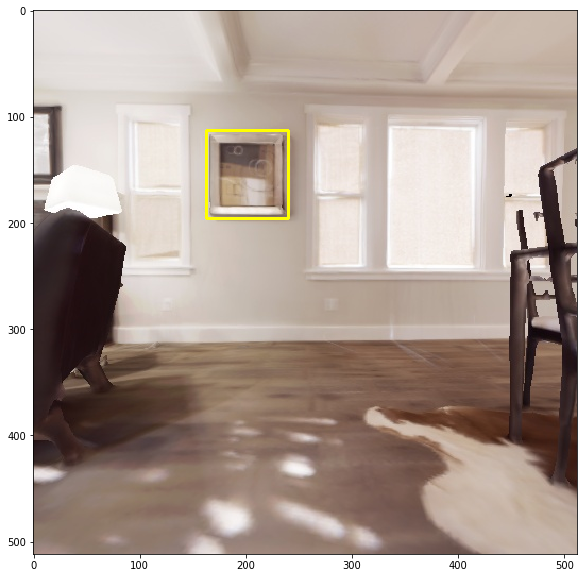

img mode RGB
(512, 512)
img mode RGB
(512, 512)


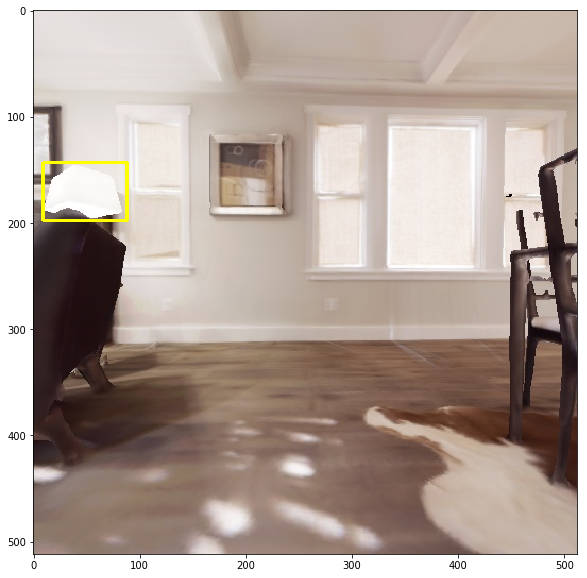

img mode RGB
(512, 512)


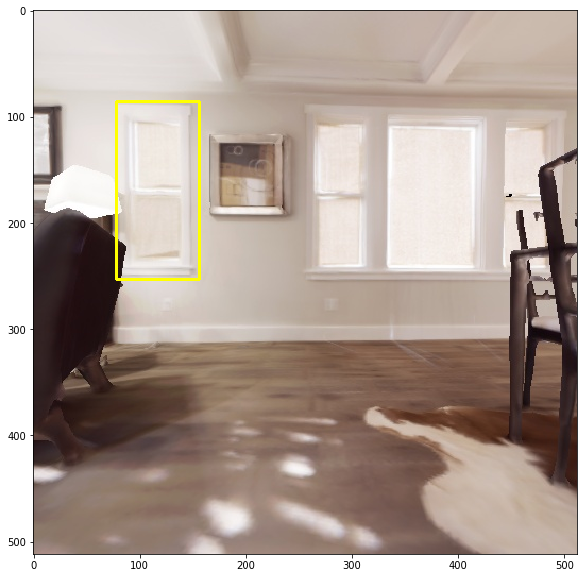

img mode RGB
(512, 512)
url https://locobot-bucket.s3-us-west-2.amazonaws.com/ActiveVisionDatasets/habitat_turk_data/00420.jpg
Time take in minutes  6.433333333333334
WorkerID A1M52J1BIO1O2V
Instances [{"color":"#2ca02c","label":"Object"},{"color":"#1f77b4","label":"Object"},{"color":"#ff7f0e","label":"Object"},{"color":"#d62728","label":"Object"},{"color":"#9467bd","label":"Object"}]
img mode RGB
(512, 512)


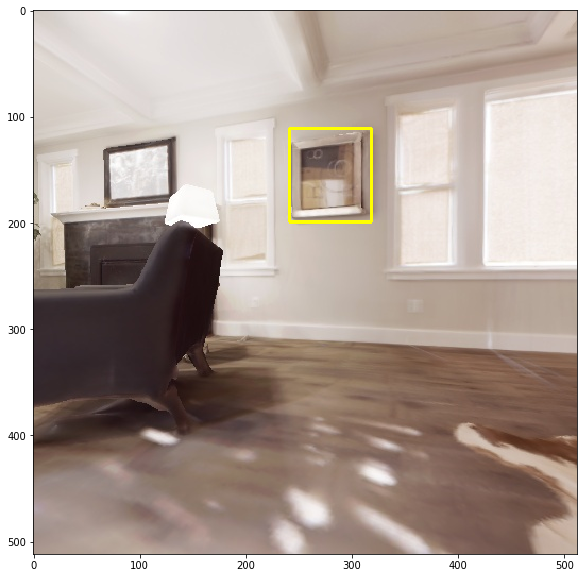

img mode RGB
(512, 512)


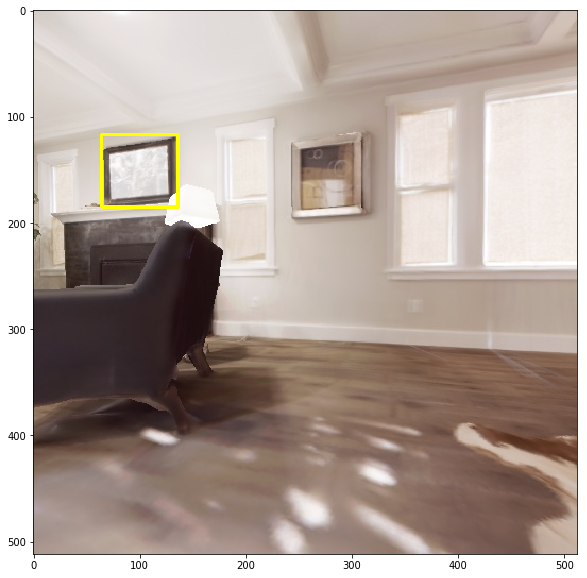

img mode RGB
(512, 512)


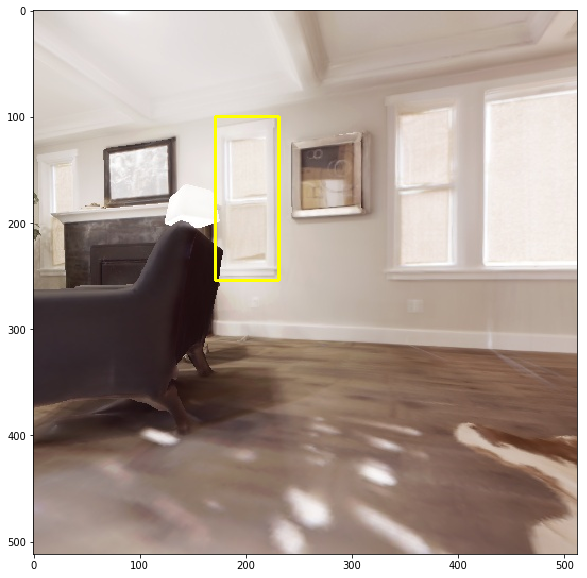

img mode RGB
(512, 512)


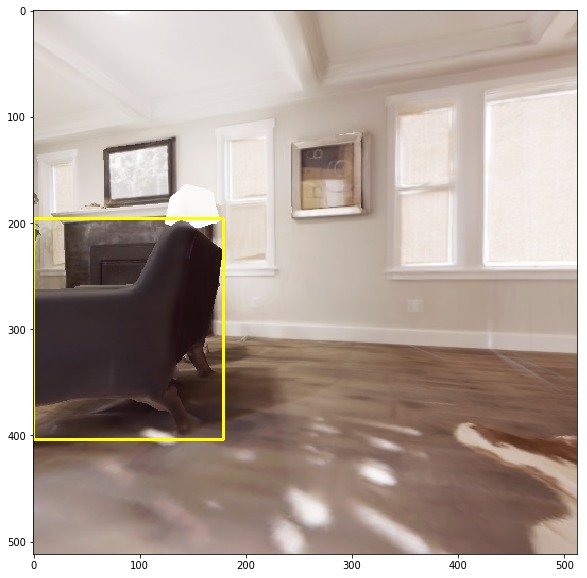

img mode RGB
(512, 512)


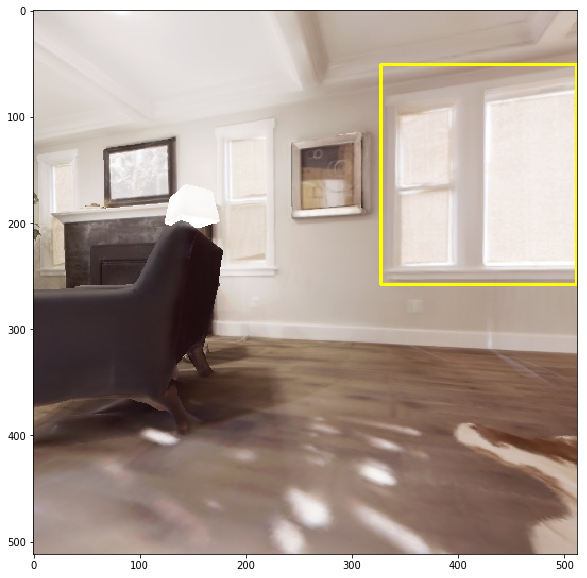

url https://locobot-bucket.s3-us-west-2.amazonaws.com/ActiveVisionDatasets/habitat_turk_data/00480.jpg
Time take in minutes  7.516666666666667
WorkerID A1HAX74U9X7MH7
Instances [{"color":"#2ca02c","label":"Object"},{"color":"#1f77b4","label":"Object"},{"color":"#ff7f0e","label":"Object"},{"color":"#d62728","label":"Object"},{"color":"#9467bd","label":"Object"},{"color":"#8c564b","label":"Object"},{"color":"#e377c2","label":"Object"},{"color":"#7f7f7f","label":"Object"},{"color":"#bcbd22","label":"Object"},{"color":"#ff9896","label":"Object"},{"color":"#17becf","label":"Object"}]
img mode RGB
(512, 512)


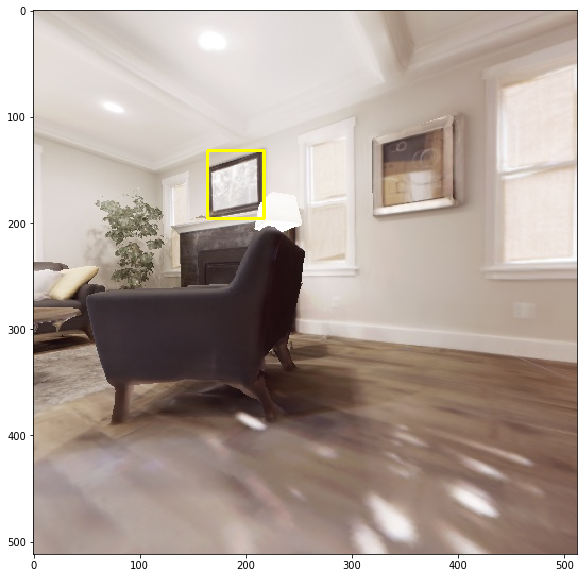

img mode RGB
(512, 512)


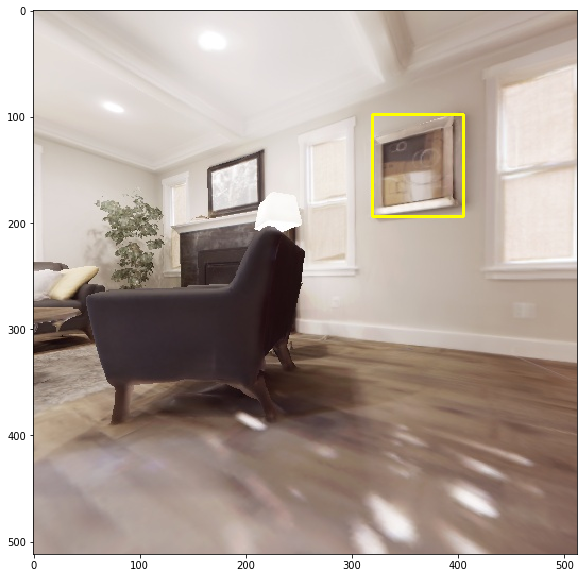

img mode RGB
(512, 512)


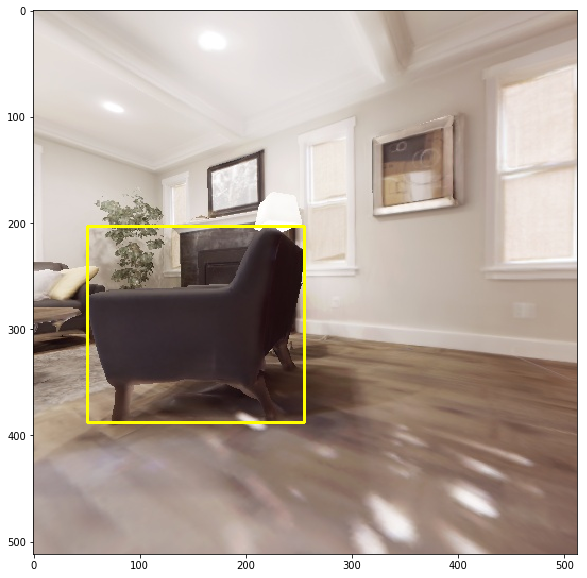

img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)
img mode RGB
(512, 512)


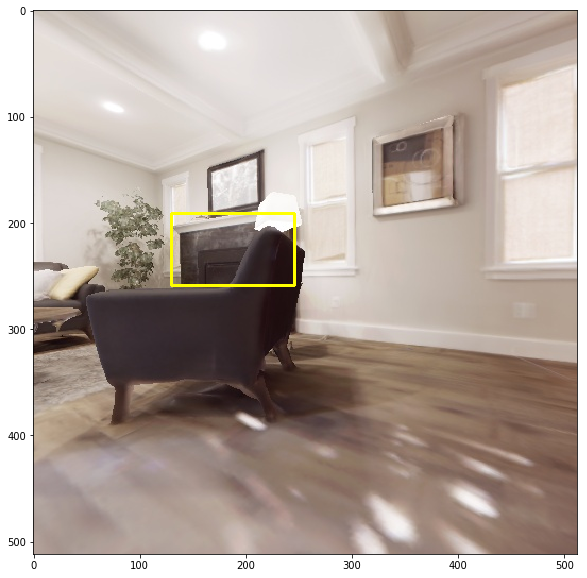

img mode RGB
(512, 512)


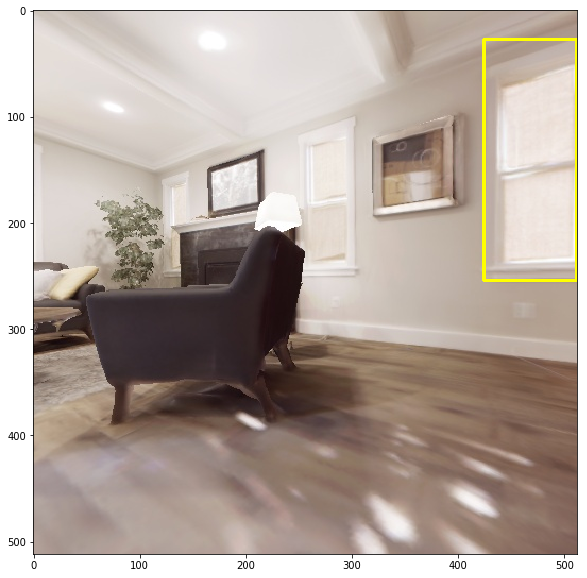

img mode RGB
(512, 512)


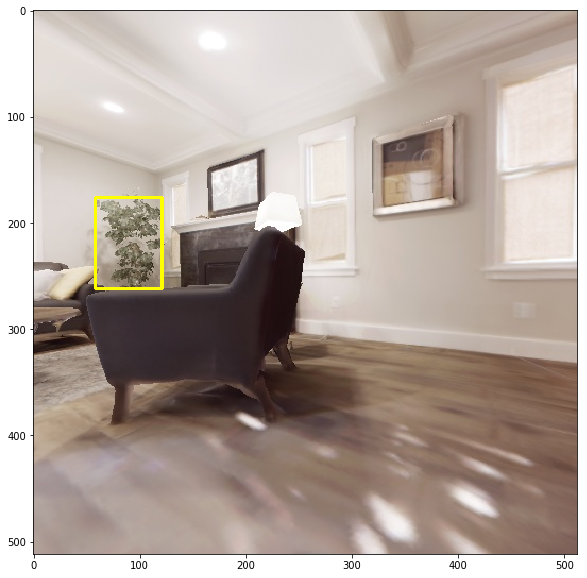

img mode RGB
(512, 512)
img mode RGB
(512, 512)


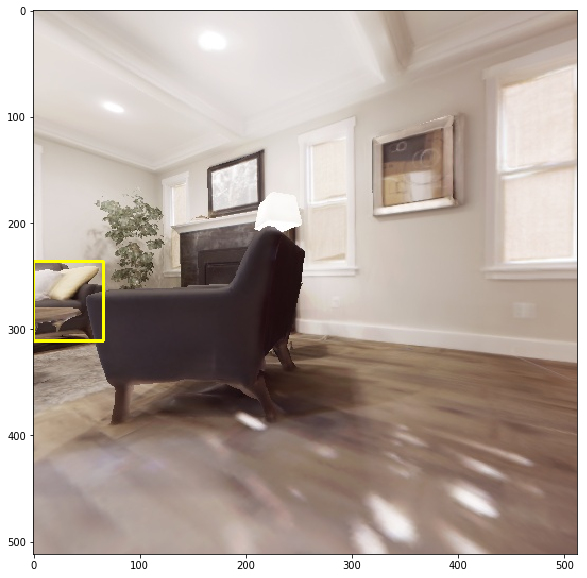

In [17]:
displayResultsbbox('Batch_4352206_batch_results.csv', saveToDisk=True, path='bboxedObjects1')